# QSIRecon
## Reconstructing a structural connectome 


**Author:** Monika Doerig

**Date:** 16 July 2026

**License:** 
<div style="margin-top: 10px;">
    <a href="https://opensource.org/licenses/MIT" target="_blank" style="color: #0066cc;">
        <i class="fas fa-balance-scale"></i> MIT License
    </a>
</div>


**Note:** If this notebook uses neuroimaging tools from Neurocontainers, those tools retain their original licenses. Please see <a href="https://neurodesk.org/overview/how-to-cite-us/" target="_blank" style="color: #0066cc;">Neurodesk citation guidelines</a> for details.

<details style="border-left: 4px solid #f0a500; background-color: rgba(240, 165, 0, 0.08); border-radius: 4px; padding: 0.75em 1em; margin: 1em 0;">
  <summary style="cursor: pointer; display: flex; justify-content: space-between; align-items: center; list-style: none; font-size: 1.1em;">
    <strong style="color: black;">✨ Use of AI</strong>
    <span style="color: black !important; font-size: 1.1em;">▽</span>
  </summary>
  <p style="font-size: 1.1em;">This notebook was drafted with assistance from an LLM (GLM-5.2, via Neurodesk) and then revised by the author. The author reviewed the final content and takes responsibility for it.</p>
</details>

### Citation and Resources:

#### Tools included in this workflow
__QSIRecon:__

- Cieslak, M., Cook, P. A., He, X., Yeh, F. C., Dhollander, T., Adebimpe, A., Aguirre, G. K., Bassett, D. S., Betzel, R. F., Bourque, J., Cabral, L. M., Davatzikos, C., Detre, J. A., Earl, E., Elliott, M. A., Fadnavis, S., Fair, D. A., Foran, W., Fotiadis, P., Garyfallidis, E., … Satterthwaite, T. D. (2021). QSIPrep: an integrative platform for preprocessing and reconstructing diffusion MRI data. Nature methods, 18(7), 775–778. [https://doi.org/10.1038/s41592-021-01185-5](https://doi.org/10.1038/s41592-021-01185-5)

#### Workflows this work is based on
- Chains on the QSIPrep output produced by the [companion QSIPrep notebook](qsiprep.ipynb).

#### Dataset
__OpenNeuro:__
- Hannelore Aerts and Daniele Marinazzo (2018). BTC_preop. [OpenNeuro Dataset ds001226](https://openneuro.org/datasets/ds001226/versions/00001)

__OSF__ Preprocessed data with QSIPrep :
- Dörig, M. (2026, July 14). Diffusion MRI with QSIPrep & QSIRecon: Interactive NeurodeskEDU Examples. Retrieved from [osf.io/q7v8c](https://osf.io/q7v8c/overview)

#### Educational resources
- [QSIRecon documentation](https://qsirecon.readthedocs.io/)


## Load software tools and import python libraries

In [2]:
# Load QSIRecon
import module
await module.load('qsirecon/1.1.0')
await module.list()

['qsirecon/1.1.0']

The base image already provides the common scientific Python packages (see the [Neurodesktop Dockerfile](https://github.com/neurodesk/neurodesktop/blob/main/Dockerfile)). Only a few standard libraries are needed below.

In [3]:
# Import the necessary libraries
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from bs4 import BeautifulSoup
from IPython.display import HTML, display
import base64
import subprocess

### FreeSurfer license

In [ ]:
# Request a freesurfer license from https://surfer.nmr.mgh.harvard.edu/registration.html
# and store it in your homedirectory 
# This is just an exampe - please replace with your license id:
!echo "Steffen.Bollmann@cai.uq.edu.au" > ~/.license
!echo "21029" >> ~/.license
!echo "*Cqyn12sqTCxo" >> ~/.license
!echo "FSxgcvGkNR59Y" >> ~/.license

## Introduction

QSIRecon is the post-processing companion to QSIPrep (it does for diffusion MRI what [XCP-D](https://xcp-d.readthedocs.io/) does for BOLD). Where QSIPrep stops at preprocessed data, QSIRecon builds the workflows that turn it into many of the biologically interesting derivatives you actually test hypotheses on: ODF/FOD reconstruction, model fits and parameter estimates, tractography, tractometry, regional connectivity, and tabular outputs.

Its aim is to make state-of-the-art methods from [DIPY](https://dipy.org/), [MRtrix3](https://www.mrtrix.org/), [DSI Studio](https://dsi-studio.labsolver.org/), [PyAFQ](https://yeatmanlab.github.io/pyAFQ/) and other packages straightforward to apply to preprocessed dMRI. Rather than one fixed pipeline, QSIRecon offers a set of curated reconstruction workflows, selected at runtime.

This notebook runs one of them: an MRtrix3 multi-shell pipeline using MSMT-CSD to estimate fibre orientation distributions, iFOD2 probabilistic tractography to generate streamlines, and SIFT2 to weight them — producing a structural connectome, which we inspect in the QSIRecon visual report.

### Learning objectives
This notebook assumes a basic understanding of diffusion MRI and familiarity with QSIPrep's role in preprocessing (see the companion QSIPrep notebook). By the end you will be able to:
- Describe what QSIRecon does and how it relates to QSIPrep
- Select and run a QSIRecon reconstruction workflow on QSIPrep derivatives
- Inspect the resulting FOD, tractography and connectome outputs in the QSIRecon visual report

## Data Preparation
QSIRecon consumes QSIPrep derivatives. We download a copy of the output from the [QSIPrep notebook](qsiprep.ipynb) from OSF, so this notebook can be run on its own.

In [23]:
def fetch_if_missing(remote, local):
    """Fetch from OSF, downloading to a temp name so a partial file never
    looks like a complete one on rerun."""
    if os.path.exists(local):
        print(f"Already exists, skipping download: {local}")
        return
    tmp = local + ".part"
    subprocess.run(["osf", "-p", "q7v8c", "fetch", remote, tmp], check=True)
    os.replace(tmp, local)
    print(f"Downloaded: {local}")

fetch_if_missing("qsiprep/qsiprep-CON01.tar.gz", "qsiprep-CON01.tar.gz")

if os.path.exists("qsiprep-output/sub-CON01"):
    print("Already extracted, skipping: qsiprep-output/sub-CON01")
else:
    os.makedirs("qsiprep-output", exist_ok=True)
    subprocess.run(["tar", "xzf", "qsiprep-CON01.tar.gz", "-C", "qsiprep-output"], check=True)
    print("Extracted QSIPrep derivatives to qsiprep-output/")

Already exists, skipping download: qsiprep-CON01.tar.gz
Already extracted, skipping: qsiprep-output/sub-CON01


## Analysis

We run QSIRecon on the QSIPrep derivatives using the `mrtrix_multishell_msmt_noACT` reconstruction spec — an MRtrix3 multishell pipeline using MSMT-CSD for FOD estimation, iFOD2 probabilistic tractography, SIFT2 streamline weighting, and `tck2connectome` to produce a structural connectome.

As the name suggests, this spec does not use anatomically constrained tractography (ACT). The alternative `mrtrix_multishell_msmt_ACT-hsvs` spec constrains tractography using a hybrid surface-volume segmentation, but that requires FreeSurfer derivatives passed via `--fs-subjects-dir`, which our QSIPrep 1.0.1 run from the companion notebook doesn't produce — FreeSurfer would have to be run separately. The `mrtrix_multishell_msmt_ACT-fast` variant substitutes FSL FAST for the segmentation, but the QSIRecon documentation does not recommend it. So we use the non-ACT spec here.

:::{admonition} Long-running
:class: warning
Tractography with 10 million streamlines plus SIFT2 is compute-heavy. Expect a few hours depending on resources. 
:::

Let's look at the command-line arguments first and then run `qsirecon`:

In [17]:
!qsirecon --help

usage: qsirecon [-h]
                [--participant-label PARTICIPANT_LABEL [PARTICIPANT_LABEL ...]]
                [--session-id SESSION_ID [SESSION_ID ...]]
                [-d PACKAGE=PATH [PACKAGE=PATH ...]] [--bids-filter-file FILE]
                [--bids-database-dir PATH] [--nprocs NPROCS]
                [--omp-nthreads OMP_NTHREADS] [--mem MEMORY_MB] [--low-mem]
                [--use-plugin FILE] [--sloppy] [--boilerplate-only]
                [--reports-only]
                [--report-output-level {root,subject,session}] [--infant]
                [--b0-threshold B0_THRESHOLD]
                [--output-resolution OUTPUT_RESOLUTION]
                [--fs-license-file PATH] [--recon-spec RECON_SPEC]
                [--input-type {qsiprep,ukb,hcpya}] [--fs-subjects-dir PATH]
                [--skip-odf-reports] [--atlases ATLAS [ATLAS ...]] [--version]
                [-v] [-w WORK_DIR] [--resource-monitor] [--config-file FILE]
                [--write-graph] [--stop-on-first

In [6]:
%%bash
set -e -u -o pipefail
# defensive: ensure subjects dir exists at startup (same pattern as QSIPrep)
export SUBJECTS_DIR="$HOME/qsiprep-freesurfer-dir"
export APPTAINERENV_SUBJECTS_DIR=$SUBJECTS_DIR
export ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS=1
mkdir -p "$SUBJECTS_DIR"

N_CPUS=$(nproc); N_CPUS=$(( N_CPUS > 12 ? 12 : N_CPUS ))
MEM_MB=$(awk '/MemTotal/ {printf "%d", $2/1024}' /proc/meminfo)
QSIRECON_MEM=$(( MEM_MB * 75 / 100 ))
OMP_THREADS=$(( N_CPUS >= 8 ? 4 : 2 ))

qsirecon qsiprep-output qsirecon-output participant \
    --participant-label CON01 \
    --recon-spec mrtrix_multishell_msmt_noACT \
    --fs-license-file ~/.license \
    --atlases AAL116 \
    -w qsirecon-work \
    --nthreads "${N_CPUS}" --omp-nthreads "${OMP_THREADS}" --mem-mb "${QSIRECON_MEM}" \
    2>&1 | tee qsirecon.log

260705-23:48:34,12 nipype.workflow IMPORTANT:
	 Running QSIRecon version 1.1.1.dev0+gaf43da9.d20250414

         License NOTICE ##################################################
         QSIRecon 1.1.1.dev0+gaf43da9.d20250414
         Copyright The PennLINC Developers.
         
         This product includes software developed by
         the NiPreps Community (https://nipreps.org/).
         
         Portions of this software were developed at the Department of
         Psychology at Stanford University, Stanford, CA, US.
         
         This software is also distributed as a Docker container image.
         The bootstrapping file for the image ("Dockerfile") is licensed
         under the MIT License.
         
         This software may be distributed through an add-on package called
         "Docker Wrapper" that is under the BSD 3-clause License.
         #################################################################
260705-23:48:34,37 nipype.workflow IMPORTANT:
	 Buildin

#### QSIRecon outputs
The reconstruction results are nested under `derivatives/qsirecon-MRtrix3_act-None/` rather than sitting at the top level. The directory name comes from the `qsirecon_suffix` declared in the recon spec — a single run can emit several such datasets, so each is written as its own self-contained BIDS derivatives dataset, with `act-None` recording that we used the non-ACT variant.

Inside, `sub-CON01/ses-preop/dwi/` holds the reconstruction proper: per-tissue FODs from MSMT-CSD (`model-msmtcsd_param-fod_label-{WM,GM,CSF}`, with the matching response functions as `.txt`), the mtnormalise outputs, the iFOD2 streamlines (`model-ifod2_streamlines.tck.gz`), the SIFT2 weights and proportionality coefficient (`model-sift2_streamlineweights.csv`, `model-sift2_mu.txt`), and the connectome itself in `connectivity.mat`. The `figures/` directory holds the panels that the visual report inlines, and `sub-CON01_ses-preop.html` is that report.

At the top level, `atlases/` contains the AAL116 atlas as passed to `--atlases`, while the top-level`sub-CON01/ses-preop/dwi/` holds it resampled into the subject's ACPC space — the parcellation actually used to build the connectome.

In [15]:
! tree qsirecon-output/

qsirecon-output/
├── atlases
│   ├── atlas-AAL116
│   │   ├── atlas-AAL116_dseg.tsv
│   │   ├── atlas-AAL116_space-MNI152NLin2009cAsym_res-01_dseg.json
│   │   └── atlas-AAL116_space-MNI152NLin2009cAsym_res-01_dseg.nii.gz
│   └── dataset_description.json
├── dataset_description.json
├── derivatives
│   └── qsirecon-MRtrix3_act-None
│       ├── dataset_description.json
│       ├── logs
│       │   ├── CITATION.bib
│       │   ├── CITATION.md
│       │   └── CITATION.tex
│       ├── sub-CON01
│       │   └── ses-preop
│       │       ├── dwi
│       │       │   ├── sub-CON01_ses-preop_acq-AP_space-ACPC_connectivity.mat
│       │       │   ├── sub-CON01_ses-preop_acq-AP_space-ACPC_exemplarbundles.zip
│       │       │   ├── sub-CON01_ses-preop_acq-AP_space-ACPC_model-ifod2_streamlines.tck.gz
│       │       │   ├── sub-CON01_ses-preop_acq-AP_space-ACPC_model-msmtcsd_param-fod_label-CSF_dwimap.mif.gz
│       │       │   ├── sub-CON01_ses-preop_acq-AP_space-ACPC_model-msmtcsd_param-fod_labe

## 3. Results
We display the full QSIRecon visual report. It contains FOD peak/ODF visualisations and the connectome matrices figure, alongside run provenance and summary sections. The report references its figures as separate files, so we inline them (PNGs as base64, SVGs embedded directly) to make it render in the notebook.

In [21]:
# Display the QSIRecon HTML report with all images inlined.
# PNGs are base64-encoded; SVGs are embedded directly into the DOM.
def display_report(report_path):
    report_dir = os.path.dirname(report_path)
    with open(report_path) as f:
        soup = BeautifulSoup(f, 'html.parser')
    # Inline <img src=...> tags: PNG as base64, SVG embedded directly
    for img in soup.find_all('img'):
        src = img.get('src', '')
        if not src:
            continue
        img_path = os.path.join(report_dir, src.lstrip('./'))
        if os.path.exists(img_path):
            if src.endswith('.svg'):
                with open(img_path) as f:
                    svg_soup = BeautifulSoup(f.read(), 'html.parser')
                    svg_tag = svg_soup.find('svg')
                    if svg_tag:
                        img.replace_with(svg_tag)
            elif src.endswith('.png'):
                with open(img_path, 'rb') as f:
                    data = base64.b64encode(f.read()).decode()
                img['src'] = f'data:image/png;base64,{data}'
    # Also inline SVGs referenced in <a href> tags
    for tag in soup.find_all(href=lambda h: h and h.endswith('.svg')):
        svg_path = os.path.join(report_dir, tag['href'])
        if os.path.exists(svg_path):
            with open(svg_path) as f:
                svg_soup = BeautifulSoup(f.read(), 'html.parser')
                tag.replace_with(svg_soup)
    # Remove nav/button clutter
    for tag in soup(['button', 'nav', 'head']):
        tag.decompose()
    display(HTML(str(soup)))


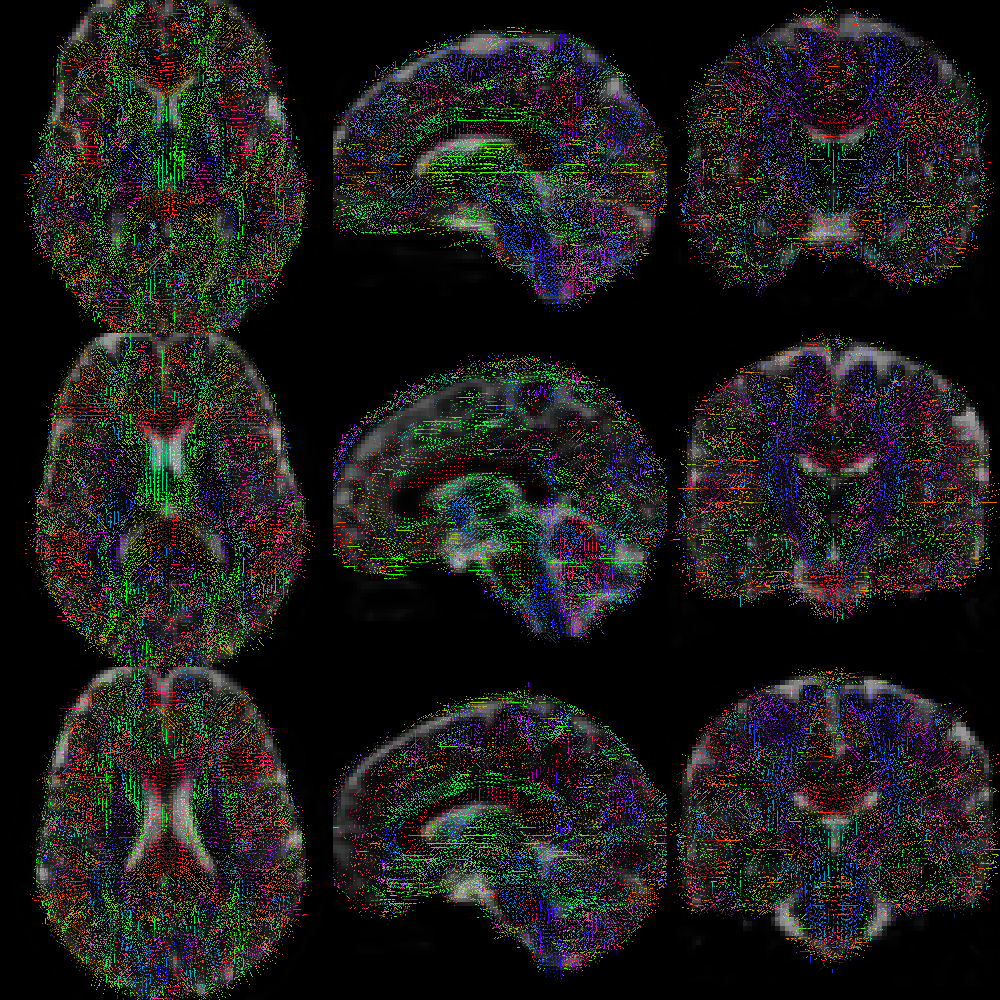
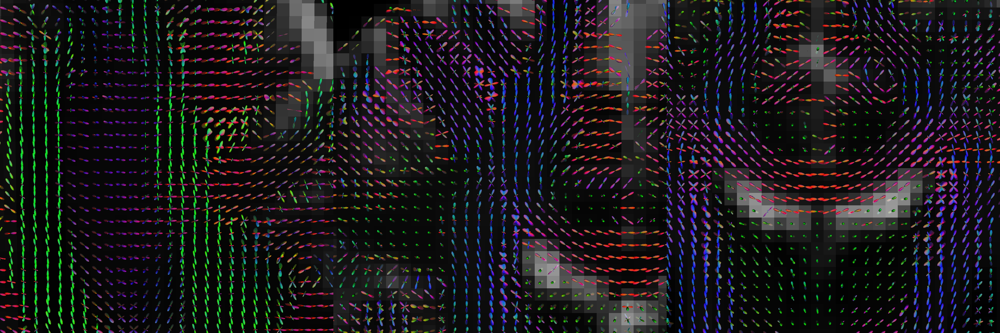

In [22]:
display_report('./qsirecon-output/derivatives/qsirecon-MRtrix3_act-None/sub-CON01_ses-preop.html')

## Dependencies in Jupyter/Python
- Using the package [watermark](https://github.com/rasbt/watermark) to document system environment and software versions used in this notebook, alongside the Neurodesktop version extracted from the `JUPYTER_IMAGE` or `NEURODESKTOP_VERSION` environment variables.

In [20]:
import os

%load_ext watermark

%watermark
%watermark --iversions

neurodesktop_version = (
    os.environ.get('JUPYTER_IMAGE', '').split(':')[-1] or
    os.environ.get('NEURODESKTOP_VERSION', 'unknown')
)

print(f"Neurodesktop version: {neurodesktop_version}")

Last updated: 2026-07-15T05:08:12.799732+00:00

Python implementation: CPython
Python version       : 3.13.13
IPython version      : 9.12.0

Compiler    : GCC 14.3.0
OS          : Linux
Release     : 5.15.0-177-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 30
Architecture: 64bit

IPython   : 9.12.0
bs4       : 4.15.0
matplotlib: 3.11.0
numpy     : 1.26.4
scipy     : 1.16.3

Neurodesktop version: 2026-06-13
